# **Palmer Penguins**

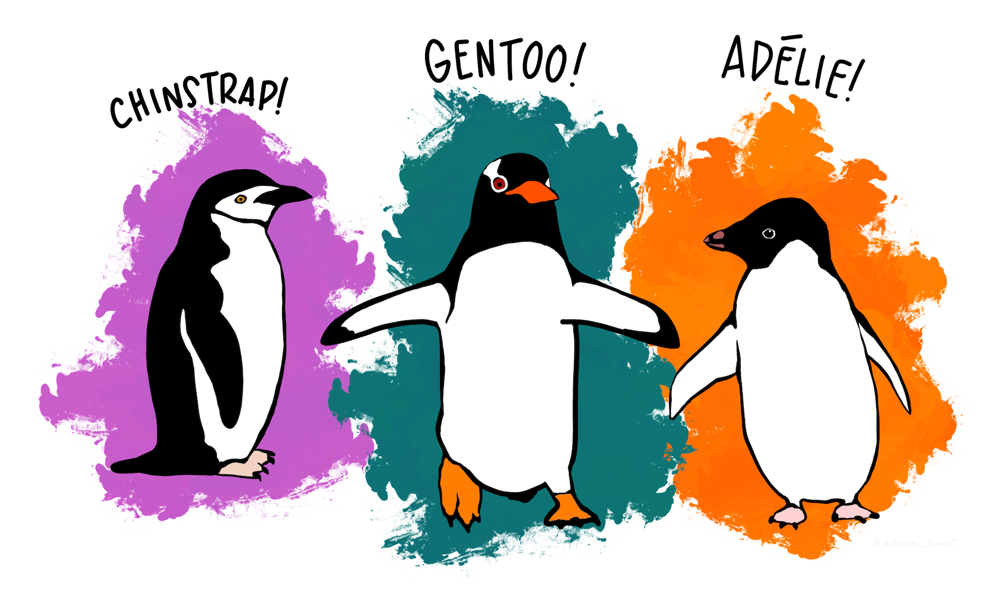

## Installing additional libraries

In [1]:
!pip install holoviews
!pip install panel

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


## Importing the libraries

In [2]:
import holoviews as hv
from holoviews import dim, opts
from holoviews.operation import gridmatrix
import numpy as np
from numpy import uint16, float32
import matplotlib.pyplot as plt
import pandas as pd
import panel as pn
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

## Importing the dataset

In [3]:
url: str = 'https://github.com/allisonhorst/palmerpenguins/blob/main/inst/extdata/penguins.csv?raw=true'
d_types = {
            'species': 'category', 'island': 'category',
            'bill_length_mm': float32, 'bill_depth_mm': float32,
            'flipper_length_mm': float32, 'body_mass_g': float32,
            'sex': 'category', 'year': uint16}
penguins_df: pd.DataFrame = pd.read_csv(
    url, header=0, dtype=d_types, encoding='UTF-8')
# chunks not used as dataset is small (less than 1000 rows)

## E.D.A.

In [4]:
print(penguins_df.head())
print(penguins_df.shape)
print(penguins_df.dtypes)
print(penguins_df.info(memory_usage='deep'))
print(penguins_df.memory_usage(deep=True))
print(penguins_df.describe(include='all', datetime_is_numeric=True))
numerics: list[str] = [
    'uint8', 'uint16', 'uint32', 'uint64',
    'int8', 'int16', 'int32',
    'int64',
    'float16', 'float32', 'float64']
non_numeric_df: pd.DataFrame = penguins_df.select_dtypes(exclude=numerics)
for column in non_numeric_df.columns:
    print(non_numeric_df[column].value_counts())
    print(non_numeric_df[column].unique())
    print(non_numeric_df[column].value_counts(normalize=True) * 100)

  species     island  bill_length_mm  bill_depth_mm  flipper_length_mm  \
0  Adelie  Torgersen       39.099998      18.700001              181.0   
1  Adelie  Torgersen       39.500000      17.400000              186.0   
2  Adelie  Torgersen       40.299999      18.000000              195.0   
3  Adelie  Torgersen             NaN            NaN                NaN   
4  Adelie  Torgersen       36.700001      19.299999              193.0   

   body_mass_g     sex  year  
0       3750.0    male  2007  
1       3800.0  female  2007  
2       3250.0  female  2007  
3          NaN     NaN  2007  
4       3450.0  female  2007  
(344, 8)
species              category
island               category
bill_length_mm        float32
bill_depth_mm         float32
flipper_length_mm     float32
body_mass_g           float32
sex                  category
year                   uint16
dtype: object
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 8 columns):
 #

## Missing data

In [5]:
missing_values: pd.Series = (penguins_df.isnull().sum())
print(missing_values)
if missing_values.any():
    print(missing_values[missing_values > 0])
    print(missing_values[missing_values > 0] / penguins_df.shape[0] * 100)
    penguins_df['sex'] = penguins_df['sex'].fillna(penguins_df['sex'].mode()[0])
    penguins_df['bill_length_mm'] = penguins_df['bill_length_mm'].fillna(
        penguins_df['bill_length_mm'].median())
    penguins_df['bill_depth_mm'] = penguins_df['bill_depth_mm'].fillna(
        penguins_df['bill_depth_mm'].median())
    penguins_df['flipper_length_mm'] = penguins_df['flipper_length_mm'].fillna(
        penguins_df['flipper_length_mm'].median())
    penguins_df['body_mass_g'] = penguins_df['body_mass_g'].fillna(
        penguins_df['body_mass_g'].median())
print(penguins_df)
print((penguins_df.isnull().sum()))  # To check after filling NaN

species               0
island                0
bill_length_mm        2
bill_depth_mm         2
flipper_length_mm     2
body_mass_g           2
sex                  11
year                  0
dtype: int64
bill_length_mm        2
bill_depth_mm         2
flipper_length_mm     2
body_mass_g           2
sex                  11
dtype: int64
bill_length_mm       0.581395
bill_depth_mm        0.581395
flipper_length_mm    0.581395
body_mass_g          0.581395
sex                  3.197674
dtype: float64
       species     island  bill_length_mm  bill_depth_mm  flipper_length_mm  \
0       Adelie  Torgersen       39.099998      18.700001              181.0   
1       Adelie  Torgersen       39.500000      17.400000              186.0   
2       Adelie  Torgersen       40.299999      18.000000              195.0   
3       Adelie  Torgersen       44.450001      17.299999              197.0   
4       Adelie  Torgersen       36.700001      19.299999              193.0   
..         ...        .

## Visualization

### Interactive (Plotly)

In [6]:
# Heatmap showing correlations among columns
fig_heatmap = px.imshow(penguins_df.corr(), color_continuous_scale='RdYlGn')
fig_heatmap.update_layout(title="Heatmap showing correlations among columns")
fig_heatmap.show()

C:\Users\juanp\AppData\Local\Temp\ipykernel_23972\2414486539.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  fig_heatmap = px.imshow(penguins_df.corr(), color_continuous_scale='RdYlGn')


In [7]:
# Plot the distribution of each quantitative variable
melted_penguins_df: pd.DataFrame = pd.melt(penguins_df, value_vars=[
    'bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'])


fig_hist = px.histogram(melted_penguins_df, nbins=20, 
                        facet_col='variable', facet_col_wrap=2, 
                        color_discrete_sequence=['green'], 
                        title="Distributions of Quantitative Variables")
fig_hist.update_traces(marker_line_color='black', marker_line_width=1)
fig_hist.show()

In [8]:
# Box plots
fig_box_species = px.box(
    penguins_df, x='bill_length_mm', y='bill_depth_mm', color='species',
     title='Boxplot: Bill Length vs Bill Depth by Species')
fig_box_species.show()

In [9]:
fig_box_sex = px.box(
    penguins_df, x='bill_length_mm', y='bill_depth_mm', color='sex',
     title='Boxplot: Bill Length vs Bill Depth by Sex')
fig_box_sex.show()

In [10]:
# Scatter plots
fig_scatter_species = px.scatter(
    penguins_df, x='bill_length_mm', y='bill_depth_mm', color='species',
     title="Scatterplot: Bill Length vs Bill Depth by Species")
fig_scatter_species.show()

### Static (Matplotlib & Seaborn)

C:\Users\juanp\AppData\Local\Temp\ipykernel_23972\1024486503.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Text(0.5, 1.0, 'Heatmap showing correlations among columns')

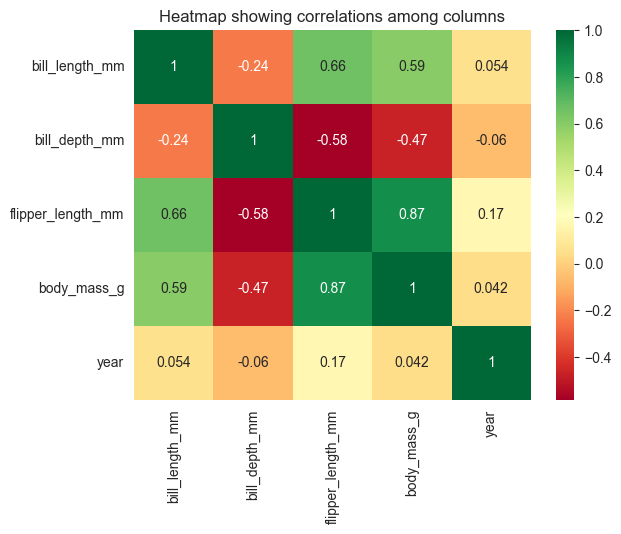

In [11]:
sns.heatmap(data=penguins_df.corr(), annot=True, cmap='RdYlGn')
plt.title("Heatmap showing correlations among columns")

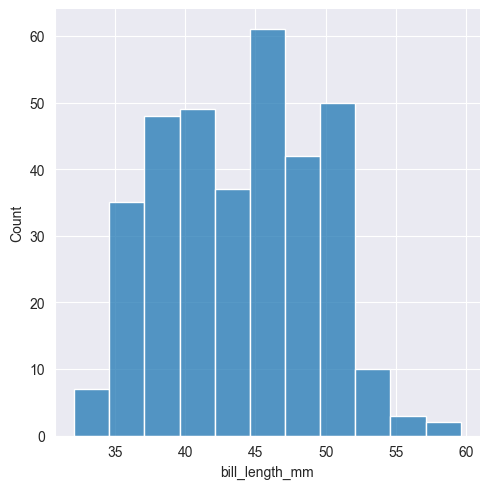

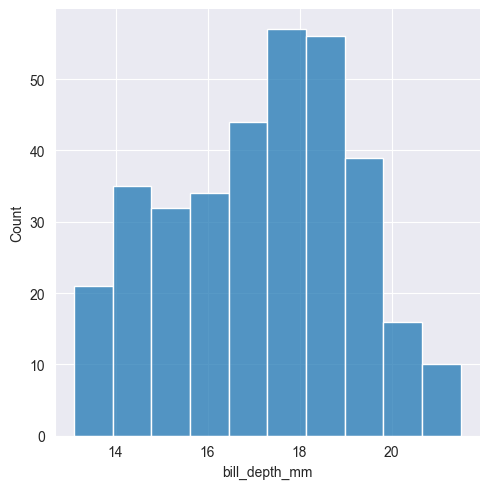

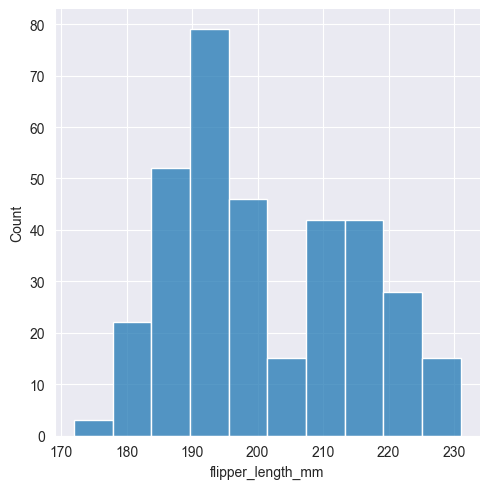

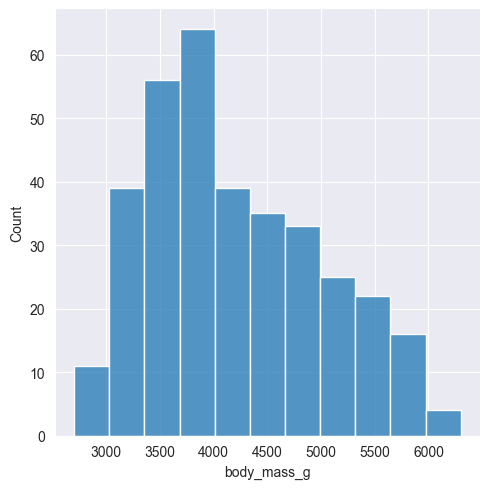

In [12]:
# Plot the distribution of each quantitative variable
sns.displot(penguins_df['bill_length_mm'])
sns.displot(penguins_df['bill_depth_mm'])
sns.displot(penguins_df['flipper_length_mm'])
sns.displot(penguins_df['body_mass_g'])

<Axes: xlabel='bill_length_mm', ylabel='bill_depth_mm'>

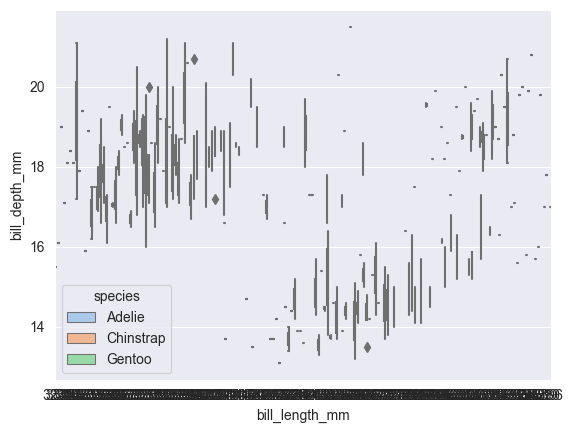

In [13]:
sns.boxplot(
    x='bill_length_mm', y='bill_depth_mm', hue='species', data=penguins_df,
     palette='pastel')

<Axes: xlabel='bill_length_mm', ylabel='bill_depth_mm'>

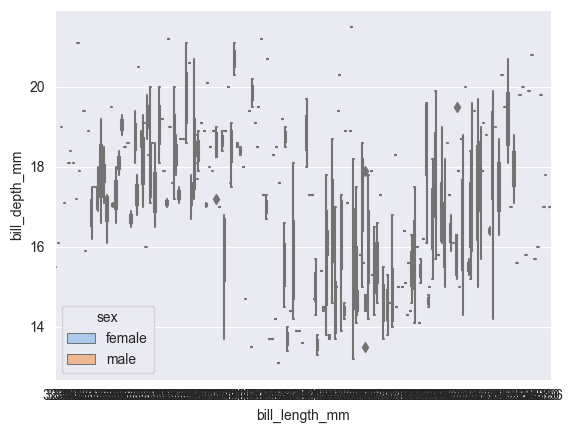

In [14]:
sns.boxplot(
    x='bill_length_mm', y='bill_depth_mm', hue='sex', data=penguins_df,
     palette='pastel')

<Axes: xlabel='bill_length_mm', ylabel='bill_depth_mm'>

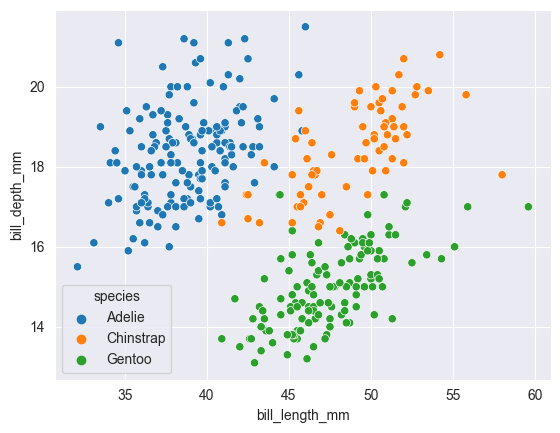

In [15]:
# Plot the relationship between bill length and bill depth
sns.scatterplot(
    data=penguins_df, x='bill_length_mm', y='bill_depth_mm', hue='species')

<Axes: xlabel='bill_length_mm', ylabel='bill_depth_mm'>

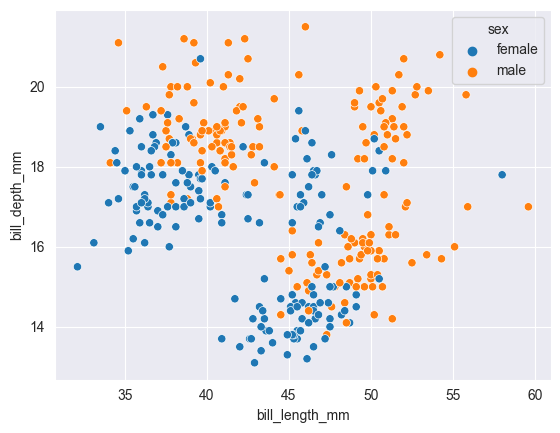

In [16]:
sns.scatterplot(
    data=penguins_df, x='bill_length_mm', y='bill_depth_mm', hue='sex')

<Axes: xlabel='flipper_length_mm', ylabel='body_mass_g'>

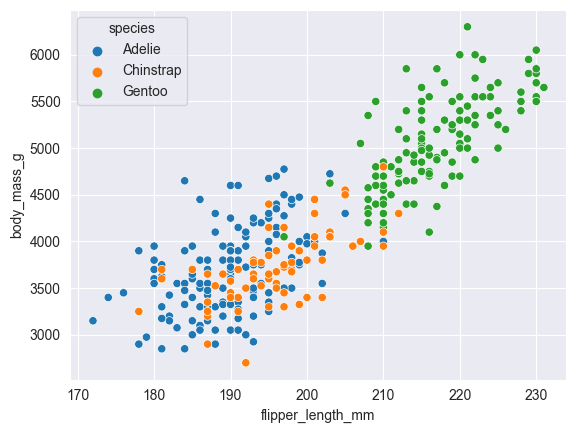

In [17]:
# Plot the relationship between flipper length and body mass
sns.scatterplot(
    data=penguins_df, x='flipper_length_mm', y='body_mass_g', hue='species')

<Axes: xlabel='species', ylabel='count'>

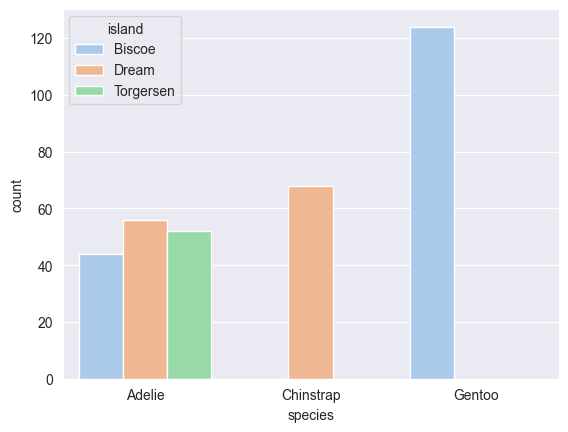

In [18]:
sns.countplot(
    x=penguins_df['species'], hue=penguins_df['island'], palette='pastel')
# Adelie species has more population in the three island so they can be treated
# in a better was as taken care and prevented them from extinction but without
# forcing them to move from their prefered habitat

<Axes: xlabel='species', ylabel='count'>

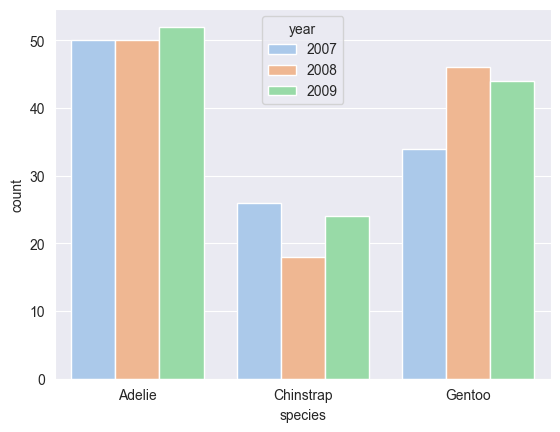

In [19]:
sns.countplot(
    x=penguins_df['species'], hue=penguins_df['year'], palette='pastel')
# Chinstrap species suffered a decreasing of their population while Gentoo is
# going in a more understable distribution as reproduction and decease should 
# change between years as ups and downs

### Custom Interactive (Holoviz & Panel)

No output because Google Colab does not support interactive plots using Holoviz and Panel. It can be used in a full Python project or maybe trying with Jupyter (Notebook, Lab or Studio)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
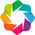

In [20]:
hv.extension('bokeh')

In [21]:
# Define the heatmap
heatmap = hv.HeatMap(
    penguins_df.corr(),
     label='Heatmap showing correlations among columns').opts(
         tools=['hover'], cmap='RdYlGn', colorbar=True, width=500, height=500)

# Wrap the plot in a Panel object and render it
pn.panel(heatmap).servable()

C:\Users\juanp\AppData\Local\Temp\ipykernel_23972\3908652716.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



HoloViews(HeatMap, height=500, sizing_mode='fixed', width=500)

In [22]:
# Define the histograms
histograms = hv.Layout([
    hv.Histogram(np.histogram(penguins_df[col], bins=20), kdims=[col]).opts(
        tools=['hover']) for col in [
            'bill_length_mm', 'bill_depth_mm', 'flipper_length_mm',
             'body_mass_g']]).cols(2)

In [23]:
# Define the boxplots
box_species = hv.BoxWhisker(
    penguins_df, 'bill_length_mm', 'bill_depth_mm', groupby='species',
     label='Boxplot: Bill Length vs Bill Depth by Species')
box_sex = hv.BoxWhisker(
    penguins_df, 'bill_length_mm', 'bill_depth_mm', groupby='sex',
     label='Boxplot: Bill Length vs Bill Depth by Sex')

In [24]:
# Define the scatter plots
scatter_species = hv.Scatter(
    penguins_df, 'bill_length_mm', 'bill_depth_mm', groupby='species',
     label='Scatter: Bill Length vs Bill Depth by Species').opts(
         color='species', cmap='Category10', legend_position='right', size=7,
          width=500, height=500)
scatter_sex = hv.Scatter(
    penguins_df, 'bill_length_mm', 'bill_depth_mm', groupby='sex',
     label='Scatter: Bill Length vs Bill Depth by Sex').opts(
         color='sex', cmap='Category10', legend_position='right', size=7,
          width=500, height=500)

In [25]:
def plot_penguins(species, sex):
    plot_data = penguins_df[
        (penguins_df['species'] == species) & (penguins_df['sex'] == sex)]
    plot = hv.Scatter(
        plot_data, kdims=['bill_length_mm'], vdims=['bill_depth_mm'])
    plot.opts(
        color='island', cmap='Category10', size=dim(
            'body_mass_g')/100, tools=['hover'],
             title=f"{species} penguins ({sex}) bill dimensions")
    return plot


# Define the interactive dashboard using Panel
species_selector = pn.widgets.Select(
    options=list(penguins_df['species'].unique()), name='Species')
sex_selector = pn.widgets.Select(
    options=list(penguins_df['sex'].unique()), name='Sex')


@pn.depends(species_selector.param.value, sex_selector.param.value)
def update_dashboard(species, sex):
    return plot_penguins(species, sex)


dashboard = pn.Column(species_selector, sex_selector, update_dashboard)
pn.panel(dashboard).servable()

Column
    [0] Select(name='Species', options=['Adelie', 'Gentoo', ...], value='Adelie')
    [1] Select(name='Sex', options=['male', 'female'], value='male')
    [2] ParamFunction(function, _pane=HoloViews)

## Conclusions

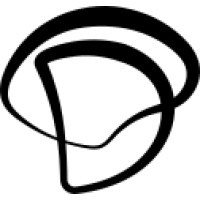

### Background

El conjunto de datos contiene información sobre los pingüinos del Archipiélago Palmer en la Antártida donde se tiene alrededor de 344 observaciones sobre 3 especies: Adelie, Chinstrap y Gentoo en tres distintas islas: Biscore, Dream y Torgersen y a su vez distintas características físicas de los animales en mención como la longitud del pico, profundidad del pico, longitud de las aletas, masa corporal y además su sexo y el año de observación.

Considerando la importancia de los pingüinos en el ecosistema global. Estos son cruciales para el de su continente ya que cumplen multiples funciones en la cadena alimenticia como depredadores y presas lo que les da un poder alto en el control de las poblaciones de otras especies como calamares, peces, focas y orcas.
A su vez, se los considera indicadores del cambio climático a través de sus clicos de vida y patrones de reproducción al ser sensibles a variaciones de temperatura y hielo lo que es representado numéricamente como una mayor o menor abundancia de su población.

### Interpretación

Al iniciar un análisis del conjunto de datos, se puede inferir muchas características interesantes a través de un mapa de calor ya que este nos proporciona correlaciones numéricas identificando las relaciones entre diferentes variables cuantitativas.
Se encontró una fuerte correlación positiva entre la longitud de las aletas y la masa corporal, una correlación negativa entre la longitud y la profundidad del pico.

*   Los pingüinos Adelia tienen el pico más corto y delgado, mientras que los pingüinos Gentoo tienen el pico
picos más largos y gruesos
*   Los pingüinos de Chinstrap tienen picos de dimensiones intermedias.
*   Los pingüinos machos generalmente
tienen picos más largos y gruesos que los pingüinos hembra de la misma especie
*   Los pingüinos más grandes tienden a tener aletas más largas para ayudarse a nadar.


Al analizar las distribuciones de las variables numéricas nos encontramos con que la mayoria son del tipo normal al seguir una forma de la campana de Gauss lo cual nos permite entender como se relacionan los distintos valores de cada una de esas variables entre si de tal manera que contamos con pocos datos atípicos, una desviación estandar mayor a 0 pero pequeña y la media y mediana son casi iguales por lo que para esas variables, es más sencillo rellenar o imputar los valores faltantes utilizando cualquiera de estas dos medidas de tendencia central. Cabe recalcar que se utilizó la mediana debido a que es una medida más robusta y menos sensible a datos anormales.

Las agrupaciones y filtros son implementados a través de diagramas de caja y de dispersión para poder visualizar y comparar las diferencias en las dimensiones del pico y la masa entre especies y sexos. Con ayuda técnica del lado biológico se podria comprender y tomar acciones de ser necesarias al respecto sobre las estrategias de alimentación y preferencias de hábitat de los pingüinos.